# Environment Setup

In [1]:
!pip install gpytoolbox

In [2]:
import gpytoolbox as gpy
import numpy as np
import matplotlib.pyplot as plt
import utils
import torch
from torch.utils.data import DataLoader


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device: {}".format(device))

Using device: cuda


# Dataset

## Random Sample

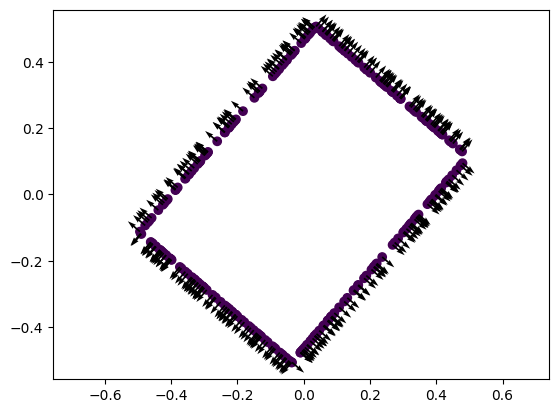

In [3]:
random_pts, normals = utils.generate_random_rectangle(300)
X_coords, Y = random_pts, np.zeros((random_pts.shape[0], 1))
_ = plt.scatter(X_coords[:,0], X_coords[:,1], c=Y)
_ = plt.quiver(X_coords[:,0], X_coords[:,1], normals[:,0], normals[:,1], color="k")
_ = plt.axis('equal')

## Generating dataset

100%|█████████████████████████████████| 100000/100000 [00:26<00:00, 3731.75it/s]


(-0.3711921378970146,
 0.3703606233000755,
 -0.4061796024441719,
 0.40470400005578994)

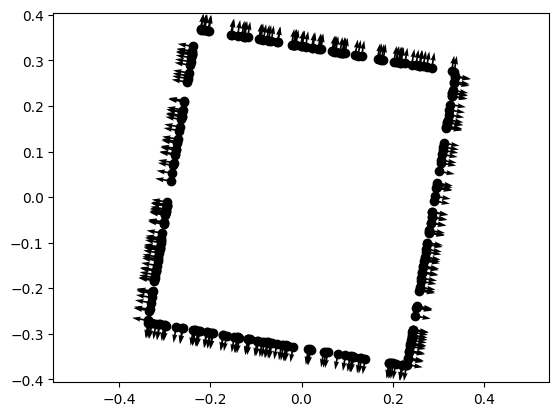

In [4]:
n_samples = 10**5
dataset = utils.RectData(num_samples=n_samples, size=300, num_seed=None)

# Visualize data samples
grid, normals = dataset[0]
plt.scatter(grid[:,0],grid[:,1],c="k")
plt.quiver(grid[:,0],grid[:,1],normals[:,0],normals[:,1],color="k")
plt.axis('equal')

100%|███████████████████████████████████| 10000/10000 [00:02<00:00, 3581.40it/s]


(-0.1679702192544937,
 0.16821114122867584,
 -0.20859975591301919,
 0.20892989113926888)

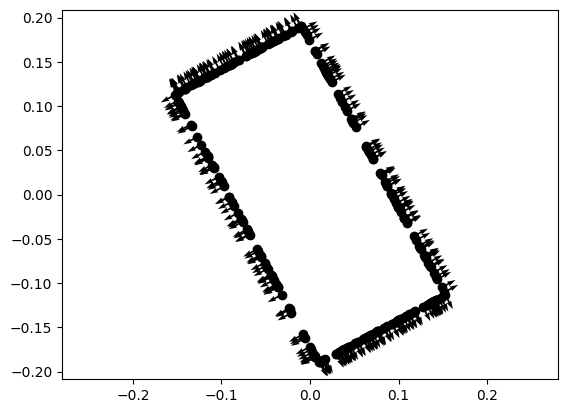

In [5]:
n_samples = 10**4
test_dataset = utils.RectData(num_samples=n_samples, size=300, num_seed=None)

# Visualize data samples
grid, normals = test_dataset[0]
plt.scatter(grid[:,0],grid[:,1],c="k")
plt.quiver(grid[:,0],grid[:,1],normals[:,0],normals[:,1],color="k")
plt.axis('equal')

## Utils

In [6]:
def plot_neural_process(xs, ys, mu, std, X,y, grid_size, plot_sample=0):
    """
    Plot Mean and Std of Neural Process side by side.

    Parameters:
    - xs: x grid values
    - ys: y grid values
    - mu: mean tensor values
    - std: standard deviation tensor values
    - X: scatter plot data
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    X = X.cpu()
    y = y.cpu().numpy()
    print(X.shape)
    # Mean of Neural Process plot
    axes[0].set_title("Mean of Neural Process")
    c1 = axes[0].pcolormesh(xs, ys, mu.cpu().view((grid_size,grid_size)).detach().numpy(), shading='gouraud', cmap="viridis")
    fig.colorbar(c1, ax=axes[0])
    axes[0].contour(xs, ys, mu.cpu().view((grid_size,grid_size)).detach().numpy(), levels=[0], colors='black')
    axes[0].scatter(X[0][:,0].numpy(), X[0][:,1].numpy(), c=y, cmap="viridis")

    # Std of Neural Process plot
    axes[1].set_title("Std of Neural Process")
    c2 = axes[1].pcolormesh(xs, ys, std.cpu().view((grid_size,grid_size)).detach().numpy(), shading='gouraud', cmap="plasma")
    fig.colorbar(c2, ax=axes[1])
    axes[1].scatter(X[0][:,0].numpy(), X[0][:,1].numpy(), c=y, cmap="viridis")
    
    plt.tight_layout()
    plt.show()

    if plot_sample > 0:
        m = torch.distributions.normal.Normal(mu, std)
        for i in range(plot_sample):
            sample = m.rsample().detach()

            plt.title("Sample of Neural Process")
            plt.pcolormesh(xs,ys,sample.cpu().reshape((grid_size,grid_size)).detach().numpy(),shading='gouraud',cmap="plasma")
            plt.colorbar()
            plt.contour(xs,ys,sample.cpu().reshape((grid_size,grid_size)).detach().numpy(),levels=[0], colors='black')
            plt.scatter(X[0][:,0].numpy(), X[0][:,1].numpy(), c=y, cmap="viridis")
            plt.tight_layout()
            plt.show()

In [7]:
# def get_context_and_target(x, normals, n_context, n_target):
#     # Ensure n_context is less than or equal to n_target
#     assert n_context <= n_target, "n_context should be less than or equal to n_target"

#     batch_size = x.size(0)
    
#     x_context_list, normals_context_list, y_context_list, x_target_list, normals_target_list, y_target_list = [], [], [], [], [], []
    
#     for b in range(batch_size):
#         # Sample n_target indices from the range [0, x.size(1)-1]
#         target_indices = torch.randperm(x.size(1))[:n_target]

#         # on surface points
#         on_surface_points = x[b, target_indices]
#         on_surface_normals = normals[b, target_indices]
#         #print(on_surface_points.shape, on_surface_normals.shape)

#         # off surface points
#         #off_surface_points = torch.from_numpy(np.random.uniform(-1,1,size=(n_target,2))).to(device)
#         off_surface_normals = torch.from_numpy(np.ones((n_target,2)) * -1).to(device)
#         #print(off_surface_points.shape, off_surface_normals.shape)

#         # off-surface points
#         off_surface_points, off_surface_y = utils.data.generate_pts_from_normals(on_surface_points.cpu().numpy(), 
#                                                                             on_surface_normals.cpu().numpy(),
#                                                                             n_points=n_target
#                                         )
#         off_surface_points, off_surface_y = torch.from_numpy(off_surface_points).to(device), torch.from_numpy(off_surface_y).to(device)
#         # off_surface_normals = torch.from_numpy(np.ones((n_target,2))).to(device)
#         # off_surface_normals = torch.where(off_surface_y > 0, off_surface_normals, -1*off_surface_normals)

#         total_samples = n_target*2
#         y_target_b = torch.zeros((total_samples,1)) # on surface = 0
#         y_target_b[n_target:, :] = off_surface_y.reshape(n_target,1) # off surface = -1

#         # concatenate on and off surface points
#         x_target_b = torch.cat((on_surface_points, off_surface_points), dim=0)
#         normals_target_b = torch.cat((on_surface_normals, off_surface_normals), dim=0)

        

#         # Get x_target and y_target values for the batch
#         #x_target_b = x[b, target_indices]
#         #normals_target_b = normals[b, target_indices]

#         # From the n_target indices, subsample n_context indices
#         context_indices = torch.randperm(total_samples)[:n_context]

#         # Get x_context and y_context values for the batch
#         #print(context_indices.shape, context_indices)
#         #print(x_target_b.shape, y_target_b.shape)
#         x_context_b = x_target_b[context_indices]
#         normals_context_b = normals_target_b[context_indices]
#         y_context_b = y_target_b[context_indices]

#         x_context_b, normals_context_b = torch.tensor(x_context_b, dtype=torch.float32), torch.tensor(normals_context_b,dtype=torch.float32)
#         x_target_b, normals_target_b = torch.tensor(x_target_b, dtype=torch.float32), torch.tensor(normals_target_b,dtype=torch.float32)
#         y_context_b, y_target_b = torch.tensor(y_context_b, dtype=torch.float32), torch.tensor(y_target_b,dtype=torch.float32)
        
#         x_context_list.append(x_context_b)
#         normals_context_list.append(normals_context_b)
#         y_context_list.append(y_context_b)
#         x_target_list.append(x_target_b)
#         normals_target_list.append(normals_target_b)
#         y_target_list.append(y_target_b)
    
#     x_context = torch.stack(x_context_list)
#     normals_context = torch.stack(normals_context_list)
#     y_context = torch.stack(y_context_list)
#     x_target = torch.stack(x_target_list)
#     normals_target = torch.stack(normals_target_list)
#     y_target = torch.stack(y_target_list)

#     return x_context, normals_context, y_context, x_target, normals_target, y_target

In [8]:
def get_context_and_target(x, normals, n_context, n_target, dist_scale=0.1):
    assert n_context <= n_target, "n_context should be less than or equal to n_target"

    batch_size = x.size(0)

    x_context_list, normals_context_list, y_context_list = [], [], []
    x_target_list, normals_target_list, y_target_list = [], [], []

    for b in range(batch_size):
        target_indices = torch.randperm(x.size(1), device=x.device)[:n_target]

        # on surface points
        on_surface_points = x[b, target_indices]
        on_surface_normals = normals[b, target_indices]

        # generate off surface points
        dists = torch.rand((n_target, 1), device=x.device) * 2 - 1  # uniform distribution in [-1, 1]
        off_surface_points = on_surface_points + dists * dist_scale * on_surface_normals
        off_surface_normals = torch.full((n_target, 2), -1.0, device=x.device)
        off_surface_y = dists * dist_scale

        y_target_b = torch.cat((torch.zeros(n_target, 1, device=x.device), off_surface_y), 0)
        x_target_b = torch.cat((on_surface_points, off_surface_points), 0)
        normals_target_b = torch.cat((on_surface_normals, off_surface_normals), 0)

        context_indices = torch.randperm(n_target * 2, device=x.device)[:n_context]
        x_context_b, normals_context_b, y_context_b = x_target_b[context_indices], normals_target_b[context_indices], y_target_b[context_indices]

        x_context_list.append(x_context_b)
        normals_context_list.append(normals_context_b)
        y_context_list.append(y_context_b)
        x_target_list.append(x_target_b)
        normals_target_list.append(normals_target_b)
        y_target_list.append(y_target_b)

    return [torch.stack(lst) for lst in [x_context_list, normals_context_list, y_context_list, x_target_list, normals_target_list, y_target_list]]


In [9]:
def test(model, dataloader, writer=None, plot=True, global_step=None, seed=42, title='', size=50, grid_size=100, use_normals=False,
        predict_twice=True):
    model.eval()
    model.to(device)
    with torch.no_grad():
        Xs, _ = next(iter(dataloader))
        context_x, context_y = Xs[0], torch.zeros(Xs[0].size(0),1)
        context_indices = torch.randperm(context_x.size(0))[:size]
        context_x = torch.Tensor(context_x[context_indices]).reshape((1,size,2)).to(device)
        context_y = torch.Tensor(context_y[context_indices]).reshape((1,size,1)).to(device)
        #print(context_x.shape, context_y.shape)
        
        # Create a set of target points corresponding to entire [-pi, pi] range
        xs = np.linspace(-1,1,grid_size)
        ys = np.linspace(-1,1,grid_size)
        Xs,Ys = np.meshgrid(xs,ys)
        Xs = Xs.flatten()
        Ys = Ys.flatten()
        grid = np.vstack((Xs,Ys)).T
        target_x = torch.Tensor(grid).reshape(1,grid_size**2,2).to(device)

        #print(context_x.shape, context_y.shape, target_x.shape)
        y_pred, kl, loss, z, y_std = model(context_x, context_y, target_x)

        # if writer is not None:
        #     writer.add_scalar('val/loss', loss, global_step=global_step)
        #     writer.add_scalar('val/y_std', y_std.mean(), global_step=global_step)
        #     writer.add_scalar('val/mse_loss', mse_loss, global_step=global_step)
        #     writer.add_scalar('val/kl', kl.mean(), global_step=global_step)

        if plot:
            plot_neural_process(xs,ys,y_pred,y_std, context_x, context_y, grid_size, plot_sample=0)
            if predict_twice:
                y_pred2, kl, loss, z, y_std = model(context_x, context_y, target_x, sample=True)
                plot_neural_process(xs,ys,y_pred2,y_std, context_x, context_y, grid_size, plot_sample=0)

            if writer is not None:
                writer.add_figure('test', global_step=global_step, close=False)
            plt.show()

    return y_pred, kl, loss, y_std

In [10]:
def plot_neural_process_sampling(xs, ys, mu, std, X,y, grid_size, n_samples, context_size):
    """
    Plot Mean and Std of Neural Process side by side.

    Parameters:
    - xs: x grid values
    - ys: y grid values
    - mu: mean tensor values
    - std: standard deviation tensor values
    - X: scatter plot data
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    X = X.cpu()
    y = y.cpu().numpy()
    print(X.shape)
    # Mean of Neural Process plot
    axes[0].set_title(f"Mean of Neural Process (N Samples: {n_samples} | Context Size: {context_size})")
    c1 = axes[0].pcolormesh(xs, ys, mu.cpu().view((grid_size,grid_size)).detach().numpy(), shading='gouraud', cmap="RdBu")
    fig.colorbar(c1, ax=axes[0])
    axes[0].contour(xs, ys, mu.cpu().view((grid_size,grid_size)).detach().numpy(), levels=[0], colors='black')
    axes[0].scatter(X[0][:,0].numpy(), X[0][:,1].numpy(), c="k")

    # Std of Neural Process plot
    axes[1].set_title(f"Std of Neural Process (N Samples: {n_samples} | Context Size: {context_size})")
    c2 = axes[1].pcolormesh(xs, ys, std.cpu().view((grid_size,grid_size)).detach().numpy(), shading='gouraud', cmap="plasma")
    fig.colorbar(c2, ax=axes[1])
    axes[1].scatter(X[0][:,0].numpy(), X[0][:,1].numpy(), c="k")
    
    plt.tight_layout()
    plt.show()

In [11]:
def plot_sampling(model, dataloader, sizes=[50], grid_size=100, n_samples=2000):
    model.eval()
    model.to(device)
    with torch.no_grad():
        X_coords, _ = next(iter(dataloader))
        for size in sizes:
            context_x, context_y = X_coords[0], torch.zeros(X_coords[0].size(0),1)
            context_indices = torch.randperm(context_x.size(0))[:size]
            context_x = torch.Tensor(context_x[context_indices]).reshape((1,size,2)).to(device)
            context_y = torch.Tensor(context_y[context_indices]).reshape((1,size,1)).to(device)
            
            # Create a set of target points corresponding to entire [-pi, pi] range
            xs = np.linspace(-1,1,grid_size)
            ys = np.linspace(-1,1,grid_size)
            Xs,Ys = np.meshgrid(xs,ys)
            Xs = Xs.flatten()
            Ys = Ys.flatten()
            grid = np.vstack((Xs,Ys)).T
            target_x = torch.Tensor(grid).reshape(1,grid_size**2,2).to(device)

            y_preds = []
            for i in range(n_samples):
                y_pred, _, _, _, _ = model(context_x, context_y, target_x, sample=True)
                y_preds.append(y_pred)
            y_preds = torch.stack(y_preds)
            y_pred_mean = y_preds.mean(dim=0)
            y_pred_std = y_preds.std(dim=0)

            plot_neural_process_sampling(xs,ys,y_pred_mean,y_pred_std, context_x, context_y, grid_size, n_samples=n_samples, context_size=size)
            plt.show()

In [12]:
from tqdm import tqdm

def evaluate(model, n=100):
    return torch.stack([
        test(model)[2] for _ in tqdm(range(n))
    ]).mean().cpu()

# Attentive Neural Process

1: priority - 0
2: normal supervision boundary only



In [13]:
from src.model import LatentModel

hparams = dict(
    x_dim=2,
    y_dim=1,
    hidden_dim=128,
    latent_dim=64,
    latent_enc_self_attn_type="dot",
    det_enc_self_attn_type="dot",
    det_enc_cross_attn_type="multihead",
    use_rnn=False)

model = LatentModel(**hparams).to(device)
optim = torch.optim.Adam(model.parameters(), lr=1e-4)

batch_size = 100
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
n_context = [25,200]
n_target = 250
epochs = 10
PRINT_AFTER = 1000

## Training Model

In [14]:
from torch.autograd import grad
import torch.nn.functional as F

def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [15]:
def train(model, optim, train_dataloader, test_dataloader, epochs, n_contexts, n_target, plot=True):
    for epoch in range(epochs):
        epoch_loss = 0.
        with tqdm(train_dataloader, unit="batch") as tepoch:
            for data in tepoch:
                tepoch.set_description(f"Epoch {epoch}")
                model.train()

                x, normals = data
                x=x.to(device)
                normals = normals.to(device)
                n_context = np.random.randint(n_contexts[0], n_contexts[1])

                context_x, context_normals, context_y, target_x, target_normals, target_y = get_context_and_target(x, normals, n_context, n_target)
                #context_y, target_y = torch.zeros((context_x.size(0),context_x.size(1),1)), torch.zeros((context_x.size(0),target_x.size(1),1))
                #print(context_x.shape, context_y.shape, target_x.shape, target_y.shape)
                context_x = context_x.to(device)
                context_y = context_y.to(device)
                target_x = target_x.to(device)
                target_y = target_y.to(device)

                optim.zero_grad()
                target_x.requires_grad_(True)
                y_pred, _, loss, _, y_std = model(context_x, context_y, target_x,target_y)
                
                pred_grad = gradient(y_pred, target_x)

                sdf_constraint = torch.where(target_y == 0, y_pred, torch.zeros_like(y_pred))
                sdf_constraint = torch.abs(sdf_constraint).mean()
                inter_constraint = torch.where(target_y == 0, torch.zeros_like(y_pred), torch.exp(-1e2 * torch.abs(y_pred))).mean()
                normal_constraint = torch.where(target_y == 0, 
                                                (1 - F.cosine_similarity(pred_grad, target_normals, dim=-1)[..., None]),
                                                torch.zeros_like(pred_grad[..., :1])
                                    ).mean()
    
                grad_constraint = (torch.abs(pred_grad.norm(dim=-1) - 1)).mean()

                l0, l1, l2, l3, l4 = 1, 3e3, 1e2, 5e1, 1e2
                eikonal_loss = sdf_constraint*l1 + normal_constraint*l2 + grad_constraint*l3 + inter_constraint*l4
                loss = loss * l0 + eikonal_loss
                loss = loss.mean()
                epoch_loss += loss.item()
                loss.backward()
                optim.step()

                if (tepoch.n - 1) % PRINT_AFTER == 0:
                    _, _, _, _ = test(
                        model, test_dataloader, plot=plot, global_step=tepoch.n-1, size=n_context)
                    # print(
                    #     f"train: {tepoch.n - 1} loss={loss.item(): 4.4g} val_loss={val_loss.item(): 4.4g}"
                    # )
                tepoch.set_postfix(loss=loss.item(), eikonal=eikonal_loss.item())

        print("Epoch: {}, Avg_loss: {}".format(epoch, epoch_loss / len(train_dataloader)))
            

Epoch 0:   0%|       | 1/1000 [00:00<14:00,  1.19batch/s, eikonal=919, loss=919]

torch.Size([1, 62, 2])


/tmp/ipykernel_500/1526548614.py:20: UserWarning: No contour levels were found within the data range.
  axes[0].contour(xs, ys, mu.cpu().view((grid_size,grid_size)).detach().numpy(), levels=[0], colors='black')


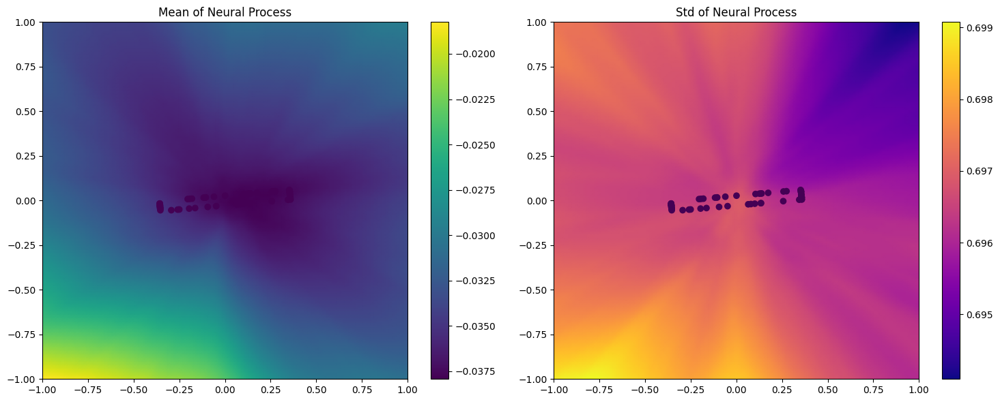

torch.Size([1, 62, 2])


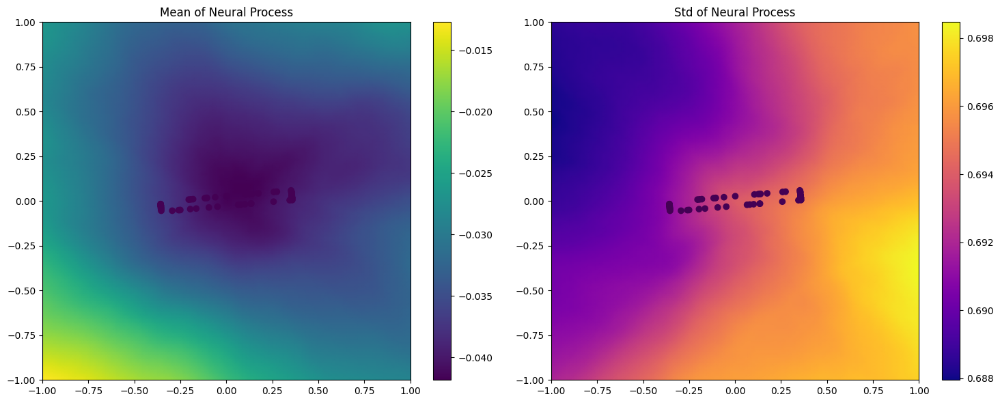

Epoch 0: 100%|██| 1000/1000 [06:19<00:00,  2.63batch/s, eikonal=89.2, loss=92.8]


Epoch: 0, Avg_loss: 140.73234334564208


Epoch 1:   0%|     | 1/1000 [00:00<07:26,  2.24batch/s, eikonal=85.8, loss=88.8]

torch.Size([1, 176, 2])


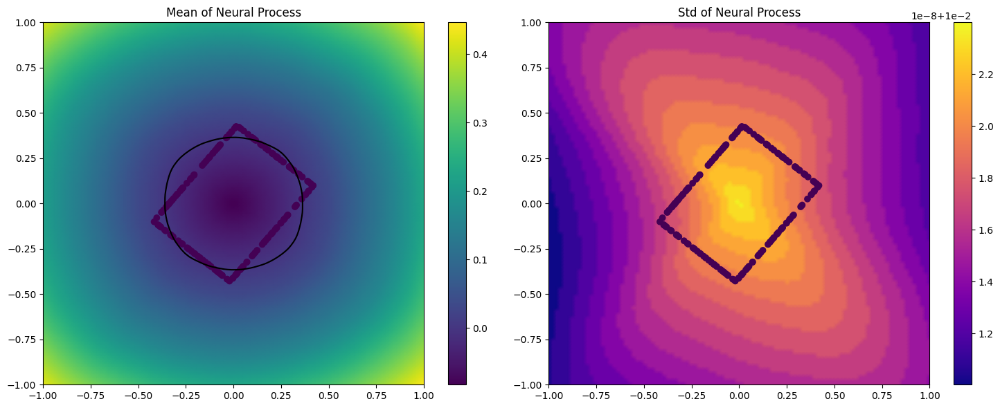

torch.Size([1, 176, 2])


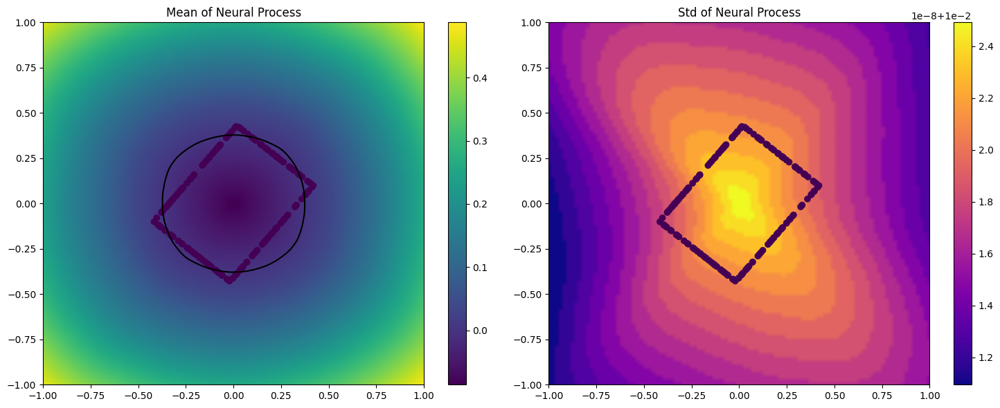

Epoch 1: 100%|██| 1000/1000 [06:16<00:00,  2.66batch/s, eikonal=62.2, loss=63.1]


Epoch: 1, Avg_loss: 82.31055506134034


Epoch 2:   0%|     | 1/1000 [00:00<07:27,  2.23batch/s, eikonal=59.7, loss=59.6]

torch.Size([1, 73, 2])


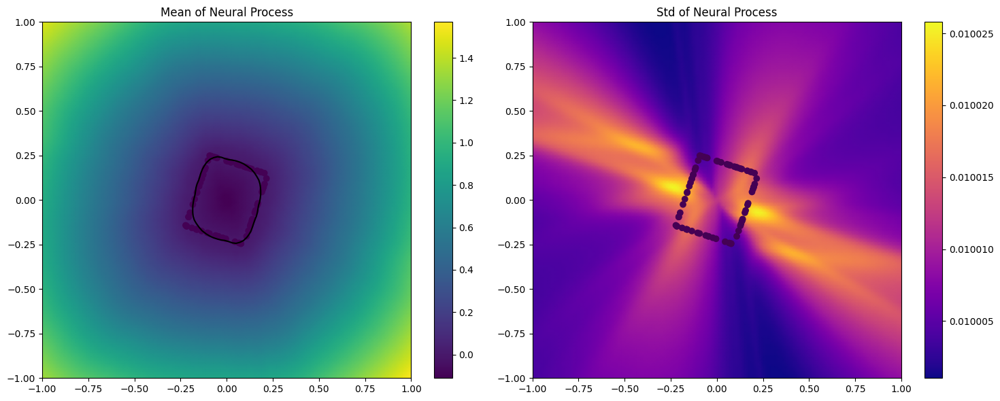

torch.Size([1, 73, 2])


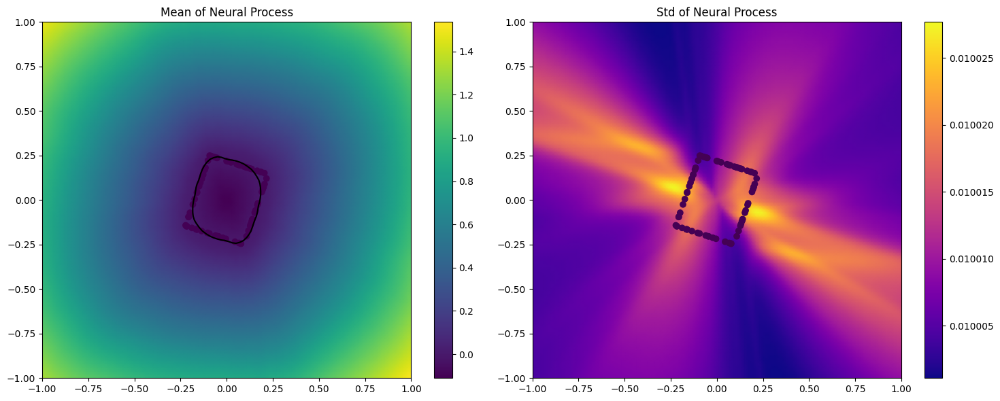

Epoch 2: 100%|██| 1000/1000 [06:17<00:00,  2.65batch/s, eikonal=43.8, loss=42.5]


Epoch: 2, Avg_loss: 53.47200156402588


Epoch 3:   0%|     | 1/1000 [00:00<07:16,  2.29batch/s, eikonal=45.3, loss=44.5]

torch.Size([1, 65, 2])


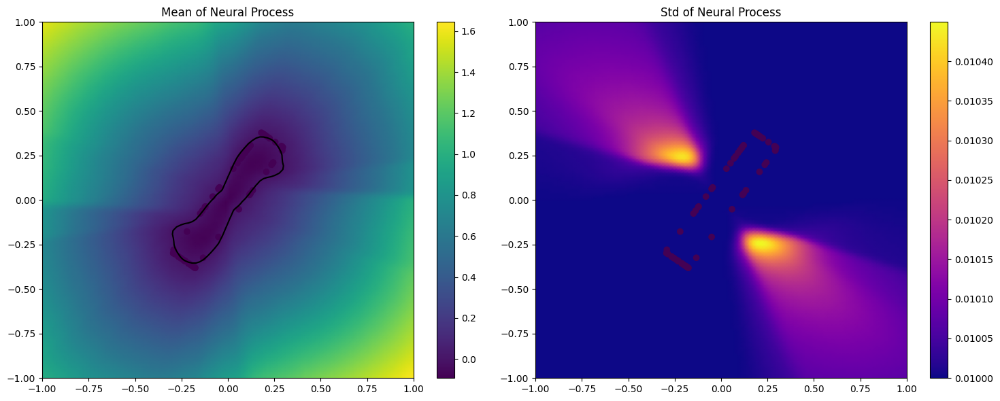

torch.Size([1, 65, 2])


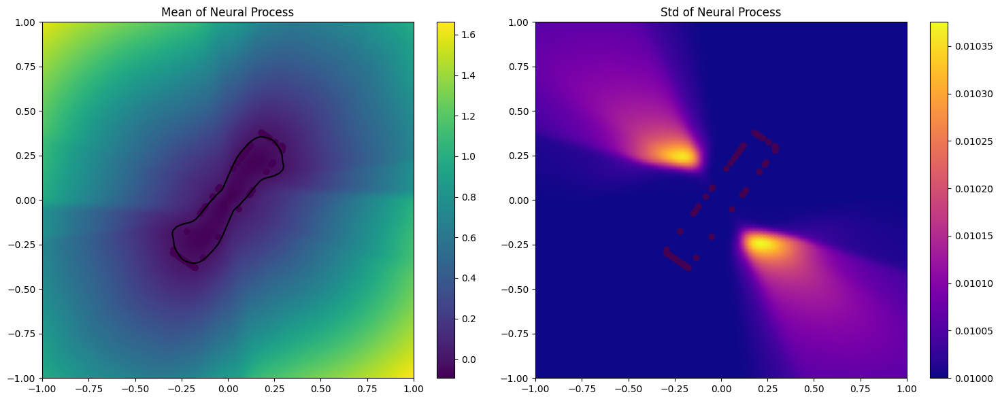

Epoch 3: 100%|██| 1000/1000 [06:16<00:00,  2.65batch/s, eikonal=39.8, loss=38.6]


Epoch: 3, Avg_loss: 44.100590209960934


Epoch 4:   0%|     | 1/1000 [00:00<05:24,  3.08batch/s, eikonal=44.6, loss=44.1]

torch.Size([1, 143, 2])


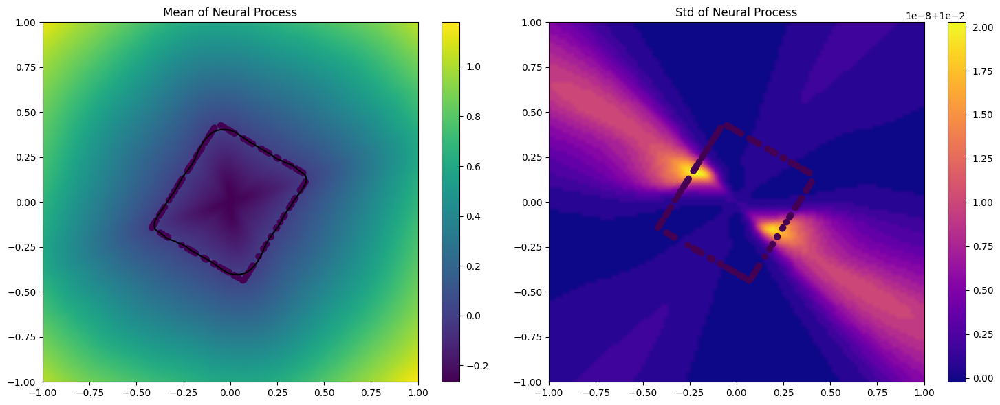

torch.Size([1, 143, 2])


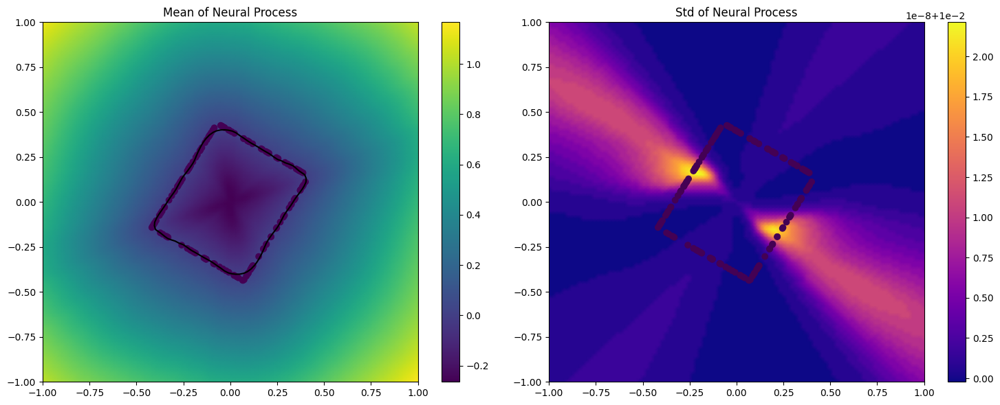

Epoch 4: 100%|██| 1000/1000 [06:16<00:00,  2.65batch/s, eikonal=42.3, loss=41.2]


Epoch: 4, Avg_loss: 40.748013458251954


Epoch 5:   0%|     | 1/1000 [00:00<06:18,  2.64batch/s, eikonal=42.8, loss=41.7]

torch.Size([1, 56, 2])


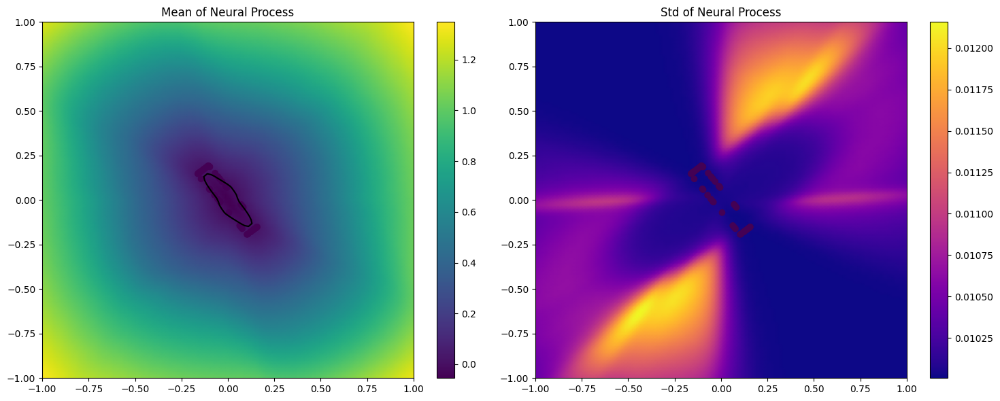

torch.Size([1, 56, 2])


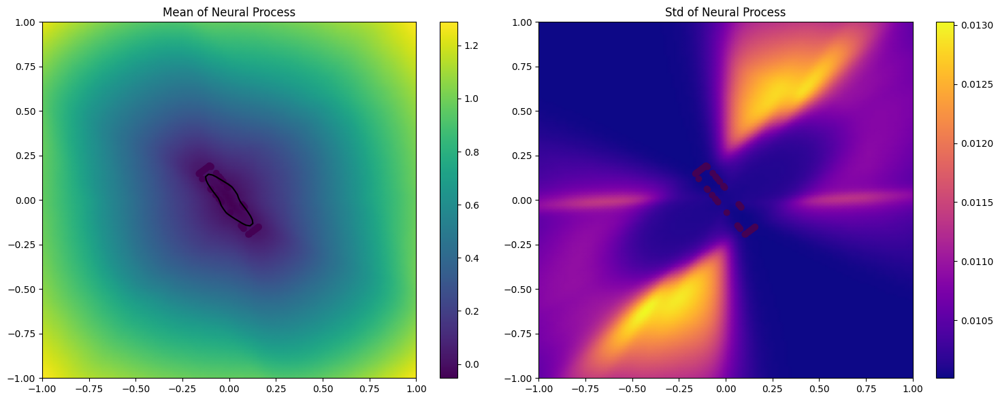

Epoch 5: 100%|████| 1000/1000 [06:15<00:00,  2.66batch/s, eikonal=39.2, loss=38]


Epoch: 5, Avg_loss: 39.854310802459715


Epoch 6:   0%|     | 1/1000 [00:00<06:25,  2.59batch/s, eikonal=39.7, loss=38.6]

torch.Size([1, 64, 2])


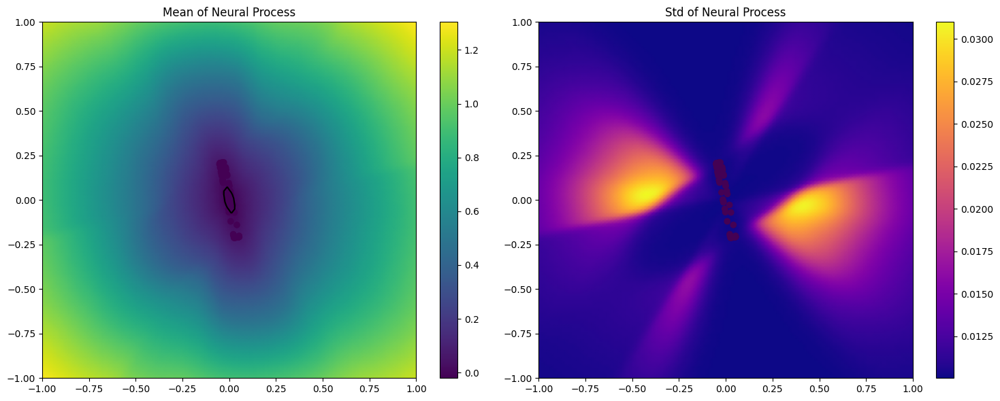

torch.Size([1, 64, 2])


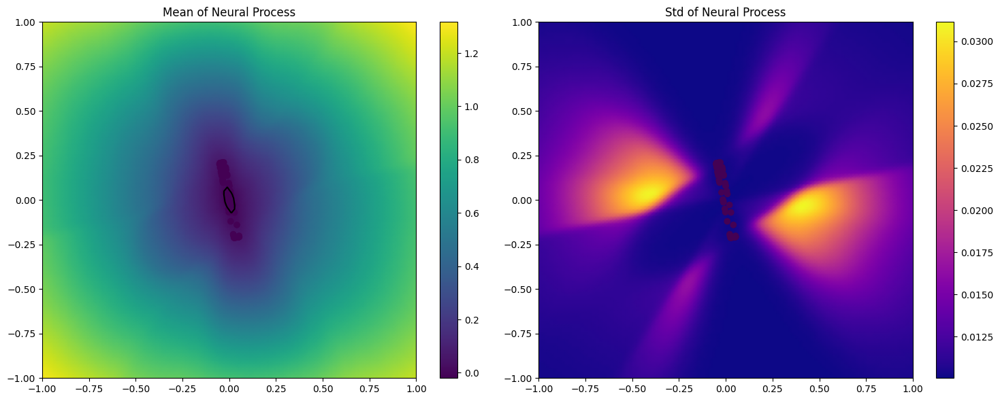

Epoch 6: 100%|██| 1000/1000 [06:19<00:00,  2.64batch/s, eikonal=38.5, loss=37.2]


Epoch: 6, Avg_loss: 38.9077187461853


Epoch 7:   0%|     | 1/1000 [00:00<05:57,  2.80batch/s, eikonal=36.3, loss=34.4]

torch.Size([1, 51, 2])


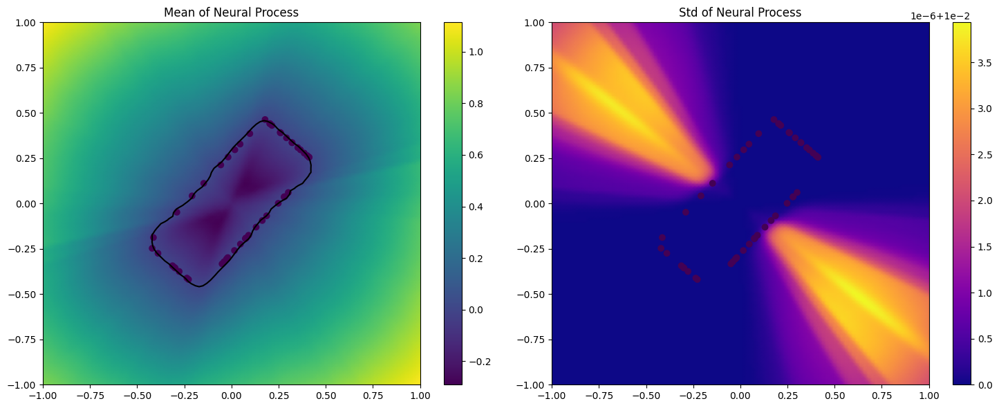

torch.Size([1, 51, 2])


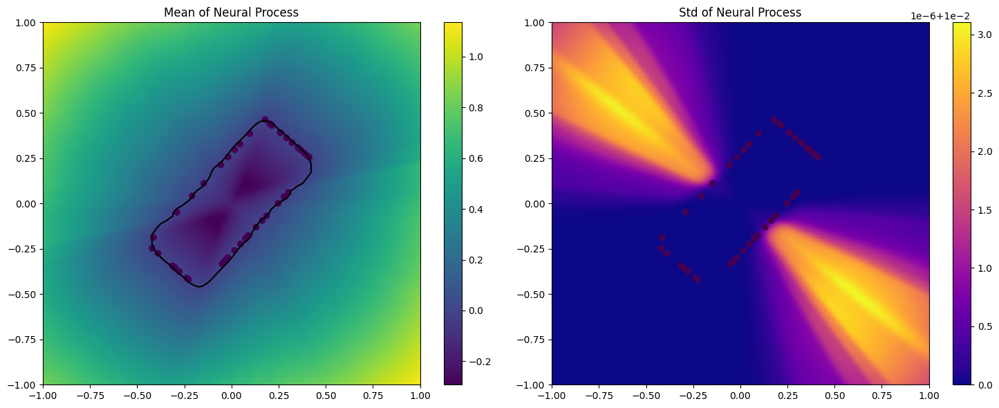

Epoch 7: 100%|██| 1000/1000 [06:15<00:00,  2.66batch/s, eikonal=37.3, loss=35.5]


Epoch: 7, Avg_loss: 38.55348201370239


Epoch 8:   0%|     | 1/1000 [00:00<05:53,  2.83batch/s, eikonal=38.3, loss=36.8]

torch.Size([1, 161, 2])


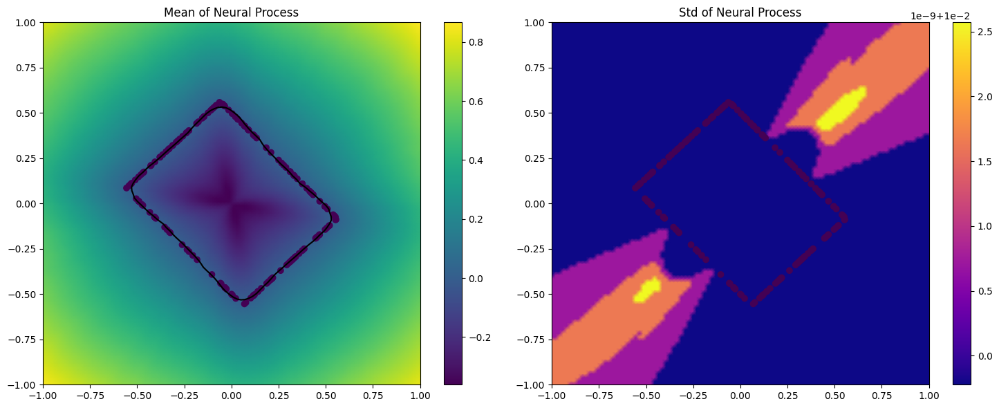

torch.Size([1, 161, 2])


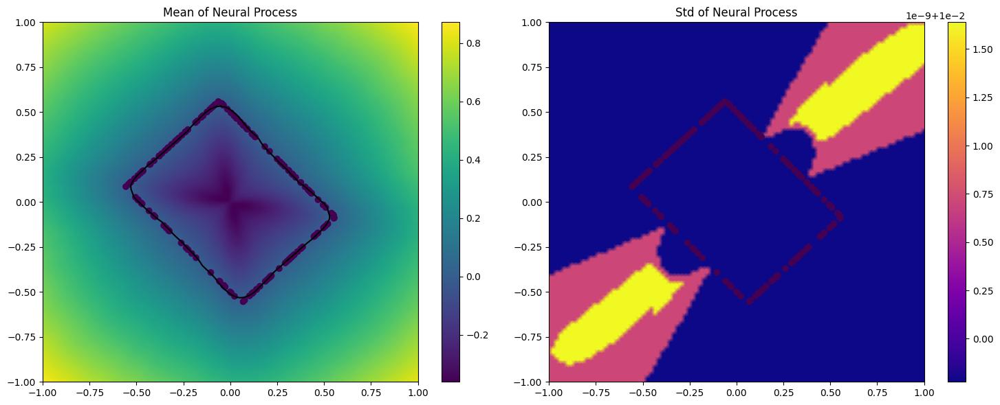

Epoch 8: 100%|██| 1000/1000 [06:15<00:00,  2.66batch/s, eikonal=49.3, loss=49.5]


Epoch: 8, Avg_loss: 38.37515878868103


Epoch 9:   0%|     | 1/1000 [00:00<06:33,  2.54batch/s, eikonal=39.2, loss=37.8]

torch.Size([1, 95, 2])


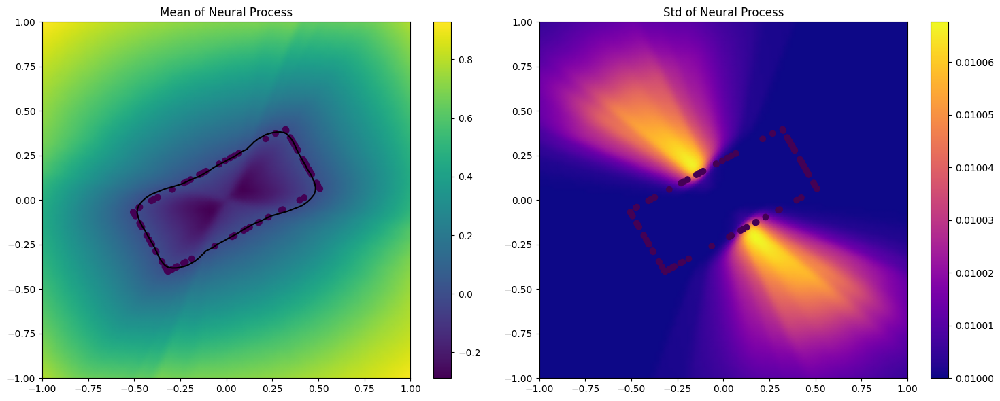

torch.Size([1, 95, 2])


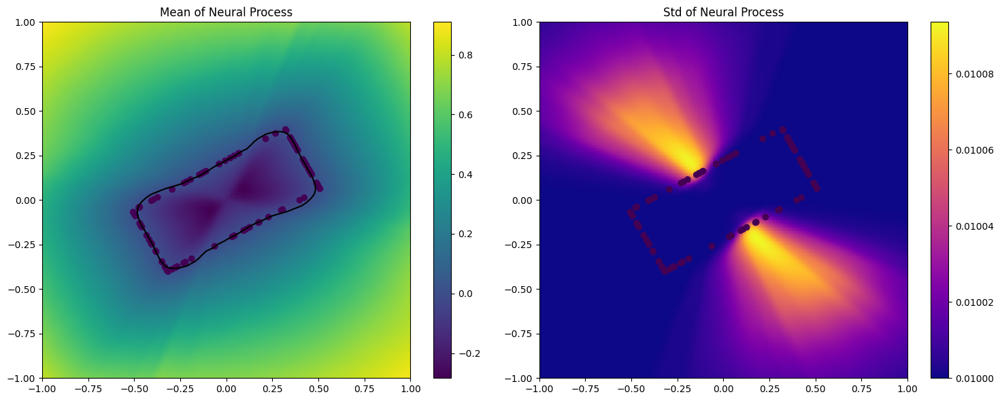

Epoch 9: 100%|██| 1000/1000 [06:15<00:00,  2.66batch/s, eikonal=43.1, loss=41.8]

Epoch: 9, Avg_loss: 37.64336617851257


In [16]:
train(model, optim, train_dataloader,test_dataloader, epochs, n_context, n_target)

## Testing

torch.Size([1, 25, 2])


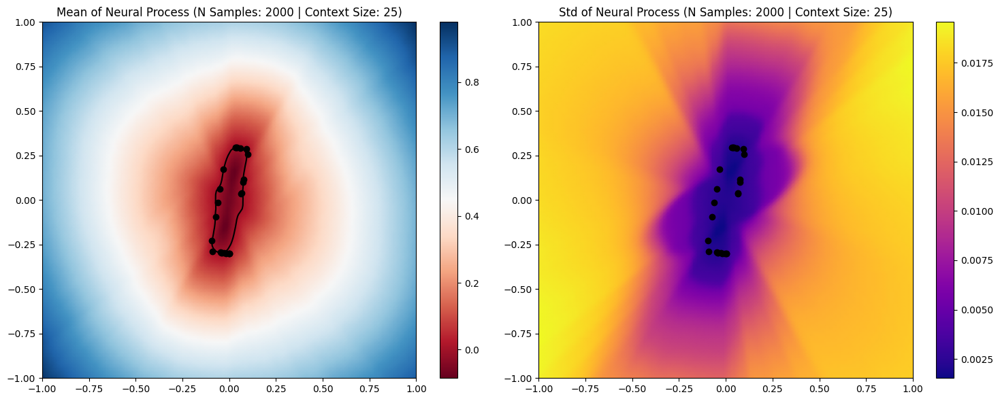

torch.Size([1, 50, 2])


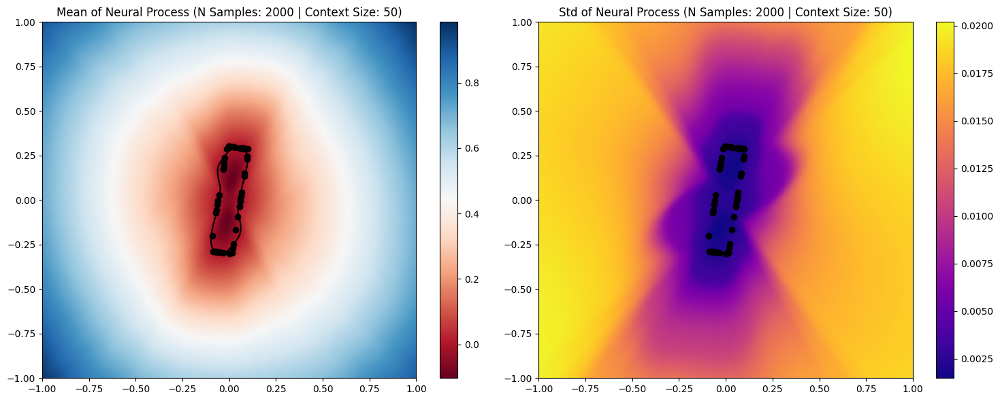

torch.Size([1, 75, 2])


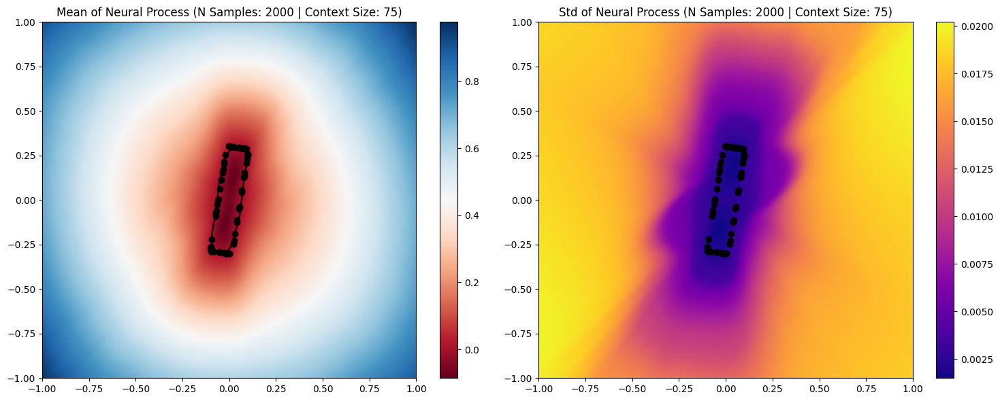

torch.Size([1, 100, 2])


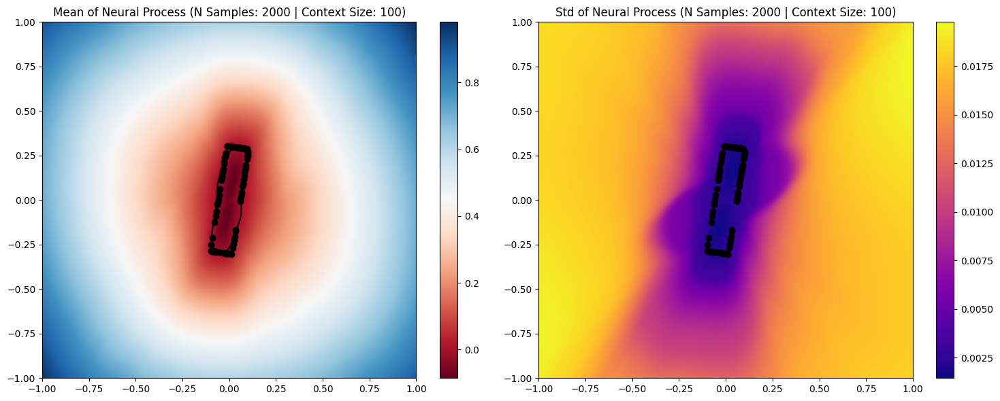

torch.Size([1, 125, 2])


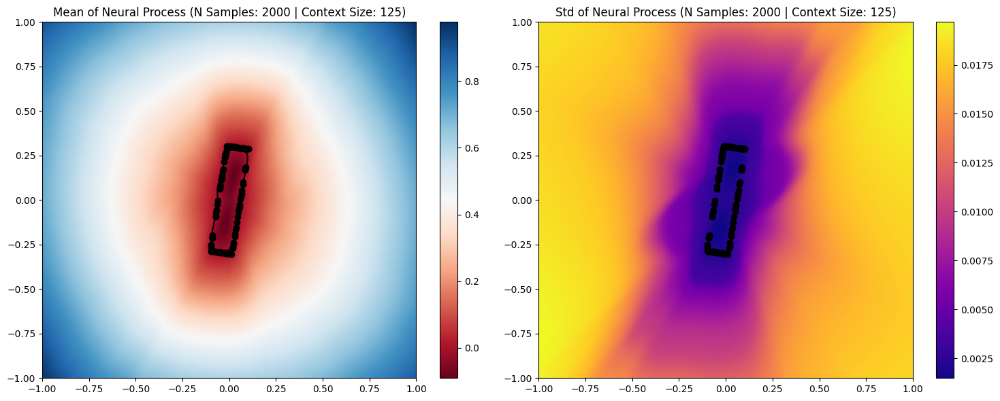

torch.Size([1, 150, 2])


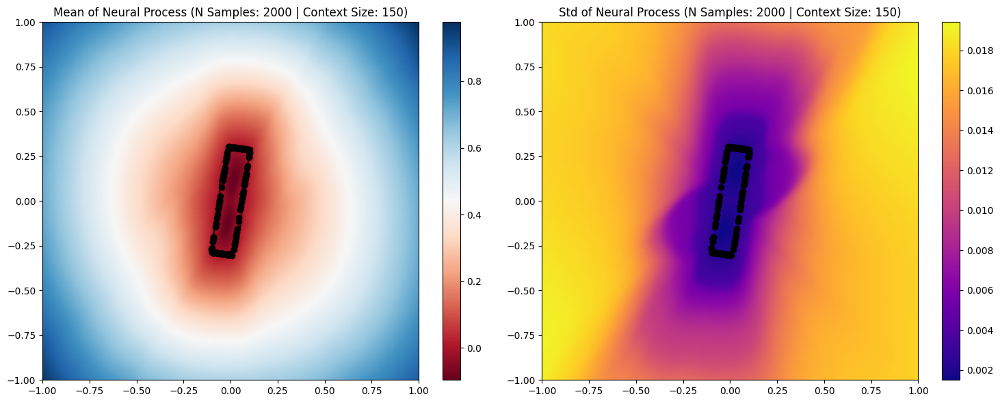

torch.Size([1, 175, 2])


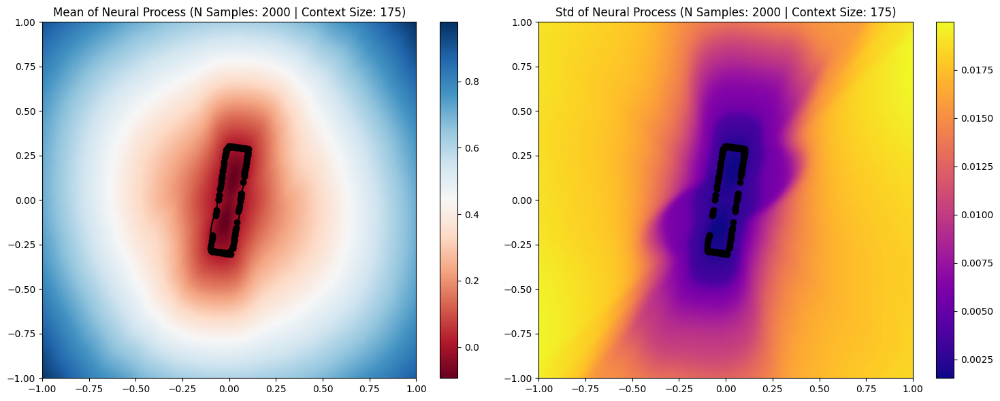

torch.Size([1, 200, 2])


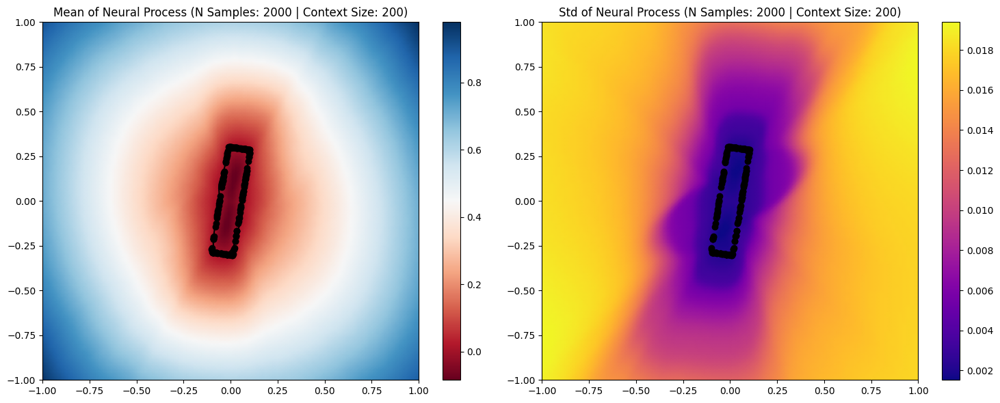

In [17]:
sizes = [25, 50, 75, 100, 125, 150, 175, 200]
plot_sampling(model,test_dataloader, sizes=sizes, n_samples=2000)